In [2]:
import pandas as pd
import numpy as np
import cv2
import os

In [3]:
from PIL import Image
import matplotlib.pylab as plt

# Source: https://www.kaggle.com/code/paulorzp/run-length-encode-and-decode/script
def rle2mask(mask_rle, shape=(1600,256)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    Source: https://www.kaggle.com/paulorzp/rle-functions-run-lenght-encode-decode
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

In [4]:
df = pd.read_csv('../../data/hubmap_orig/train.csv')

In [5]:
df.head(3)

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,37.0,Male
1,10274,prostate,HPA,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,76.0,Male
2,10392,spleen,HPA,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,82.0,Male


(3000, 3000)


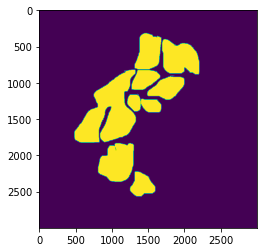

In [6]:
rle = df.loc[0, "rle"]
img_size = (int(df.loc[0, "img_width"]), 
            int(df.loc[0, "img_height"]))

mask = rle2mask(rle, shape=img_size)

print(mask.shape)

plt.imshow(mask)

In [7]:
from tqdm.notebook import tqdm

In [8]:
root = '../../data/hubmap_orig'
img_size = 1184
save_path = '../../data/hubmap_1184'

os.mkdir(save_path)
os.mkdir(f'{save_path}/train_images/')
os.mkdir(f'{save_path}/train_masks/')

In [9]:
for i, row in tqdm(df.iterrows(), total=len(df)):
    id = row['id']
    rle = row['rle']
    h, w = row['img_height'], row['img_width']

    img = cv2.imread(f'{root}/train_images/{id}.tiff')
    mask = cv2.imread(f'{root}/train_masks/{id}.png', cv2.IMREAD_GRAYSCALE)

    img = cv2.resize(img, dsize=(img_size, img_size), interpolation = cv2.INTER_LINEAR)
    mask = cv2.resize(mask, dsize=(img_size, img_size), interpolation = cv2.INTER_LINEAR)
    
    cv2.imwrite(f'{save_path}/train_images/{id}.png', img)
    cv2.imwrite(f'{save_path}/train_masks/{id}.png', mask)

  0%|          | 0/351 [00:00<?, ?it/s]

### Cropping background

In [71]:
def crop(img, mask, thresh):
    if img.sum() == 0:
        return img
        
    keep = (img.mean(axis=(0, 2)) < thresh)
    img = img[:, keep, :]
    mask = mask[:, keep]
    
    keep = (img.mean(axis=(1, 2)) < thresh)
    img = img[keep, :, :]
    mask = mask[keep, :]
    
    return img, mask

In [69]:
root = '../../data/hubmap_orig/train_images'
save_path = '../../data/hubmap_cropped/'

os.mkdir(save_path)
os.mkdir(f'{save_path}/train_images/')
os.mkdir(f'{save_path}/train_masks/')

  0%|          | 0/351 [00:00<?, ?it/s]

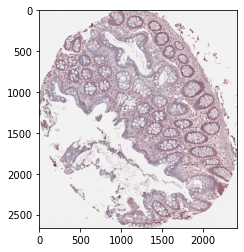

In [70]:
reduction = []
for i, row in tqdm(df.iterrows(), total=len(df)):
    id = row['id']
    rle = row['rle']
    h, w = row['img_height'], row['img_width']

    img = cv2.imread(f'{root}/{id}.tiff')
    mask = rle2mask(rle, shape=(w, h))

    img_cropped, mask_cropped = crop(img, mask, 240)

    #img = cv2.resize(img, dsize=(img_size, img_size), interpolation = cv2.INTER_LINEAR)
    #mask = cv2.resize(mask, dsize=(img_size, img_size), interpolation = cv2.INTER_LINEAR)
    
    cv2.imwrite(f'{save_path}/train_images/{id}.png', img_cropped)
    cv2.imwrite(f'{save_path}/train_masks/{id}.png', mask_cropped)
    plt.imshow(img_cropped)
    
    before_area = img.shape[0] * img.shape[1]
    after_area = img_cropped.shape[0] * img_cropped.shape[1]
    reduction.append(1 - (after_area/before_area))

In [79]:
print(f'{np.mean(reduction)*100:.2f}%')

27.92%


In [21]:
cv2.imwrite('test.png', img)

True

In [18]:
mean_1 = img.mean(axis=1)

In [21]:
mean_1 < 240

array([[False, False, False],
       [False, False, False],
       [False, False, False],
       ...,
       [False, False, False],
       [False, False, False],
       [False, False, False]])

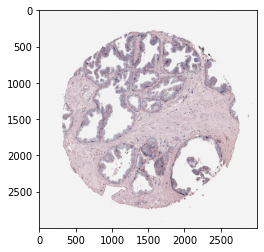

In [60]:
plt.imshow(img)

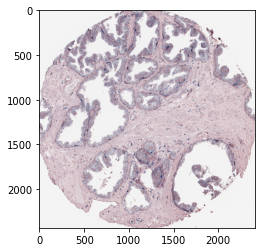

In [67]:
res = crop(img, mask, 240)
plt.imshow(res[0])

In [64]:
img.shape[0] * img.shape[1]

9000000

In [65]:
res[0].shape[0] * res[0].shape[1]

6061419

In [66]:
6e6/9e6

0.6666666666666666

In [10]:
from sklearn.model_selection import KFold, StratifiedKFold

In [15]:
ids = df.id.astype(str).values
organs = df.organ.astype(str).values

In [16]:
kf = StratifiedKFold(5, random_state=309, shuffle=True)

In [17]:
ind = list(kf.split(ids, organs))[0][1]

In [18]:
df.loc[ind]['organ'].value_counts()

KeyError: '[1, 4, 14, 21, 32, 42] not in index'

In [60]:
df.loc[ind]['organ'].value_counts()

kidney            20
prostate          19
largeintestine    12
spleen            11
lung               9
Name: organ, dtype: int64

### Investigating Lung

In [7]:
df['organ'].value_counts()

kidney            99
prostate          93
largeintestine    58
spleen            53
lung              48
Name: organ, dtype: int64

In [8]:
df = df[df['organ'] == 'lung']

  0%|          | 0/48 [00:00<?, ?it/s]

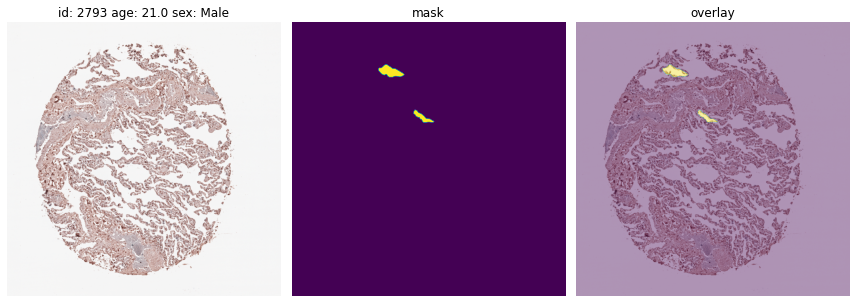

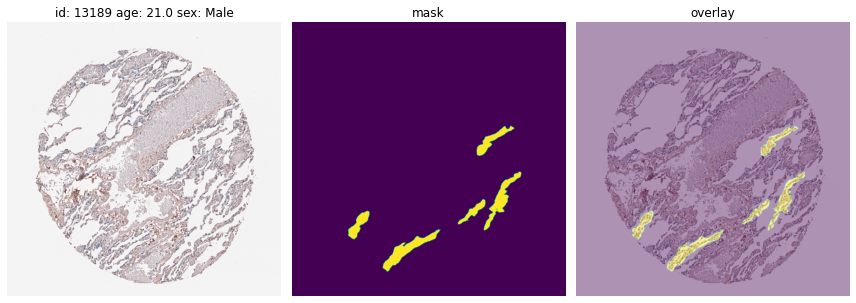

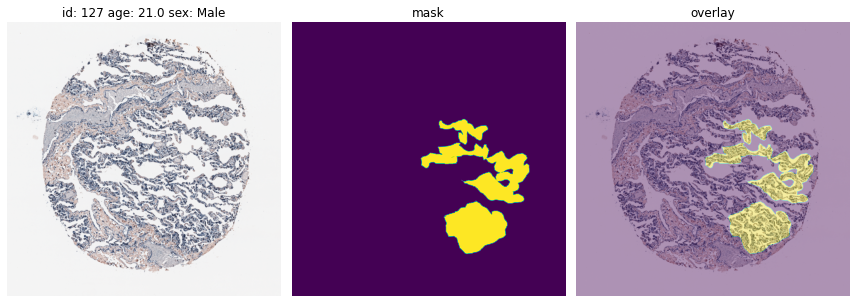

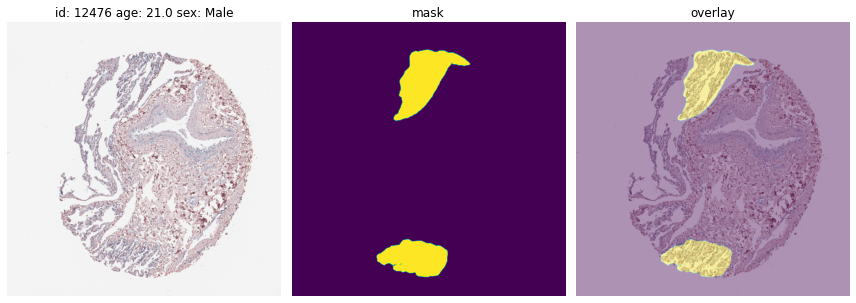

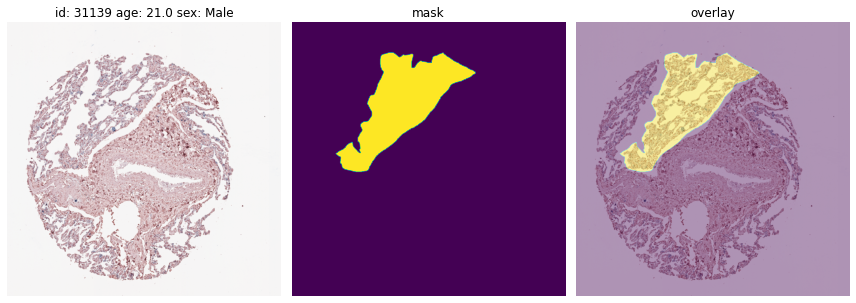

...

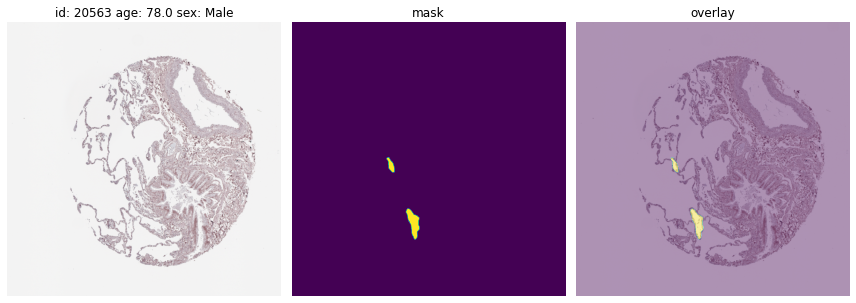

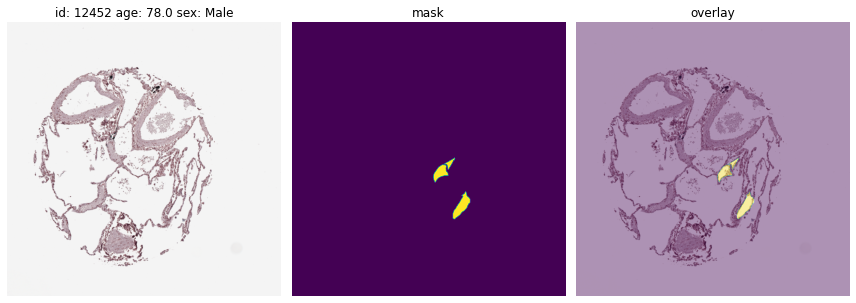

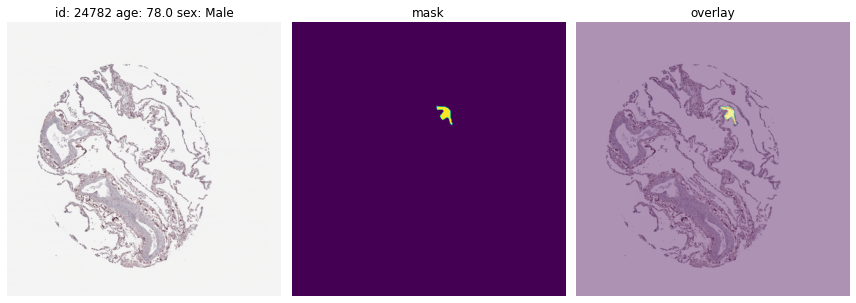

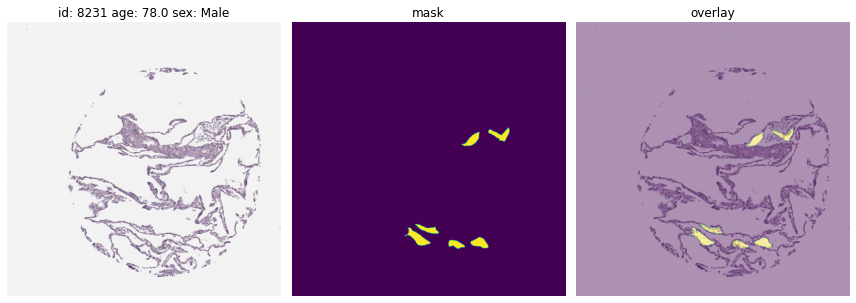

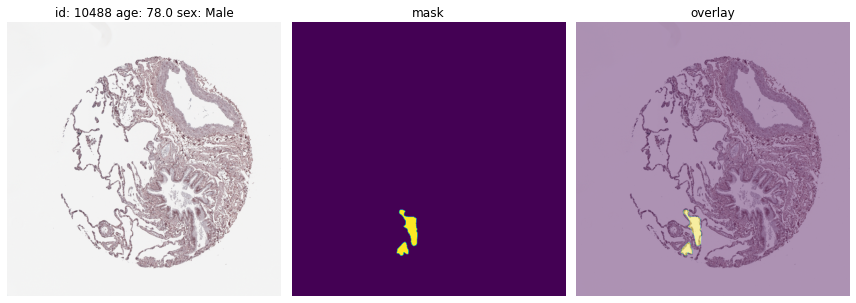

In [27]:
from contextlib import ExitStack
from genericpath import exists


for i, row in tqdm(df.sort_values(by='age').iterrows(), total=len(df)):
    id = row['id']
    rle = row['rle']
    h, w = row['img_height'], row['img_width']

    img = cv2.imread(f'{root}/{id}.tiff')
    mask = rle2mask(rle, shape=(w, h))

    m = img
    p = mask

    plt.figure(figsize=(12, 7))
    plt.subplot(1, 3, 1); plt.imshow(m); plt.axis('OFF'); plt.title(f'id: {id} age: {row.age} sex: {row.sex}')
    plt.subplot(1, 3, 2); plt.imshow(p*255); plt.axis('OFF'); plt.title('mask')
    plt.subplot(1, 3, 3); plt.imshow(m); plt.imshow(p*255, alpha=0.4); plt.axis('OFF'); plt.title('overlay')
    plt.tight_layout()
    plt.show()